## HDB Resale Price Analysis 

Let's investigate HDB resale prices in Singapore and try to understand why some might be higher than others. We should also do some kind of prediction to see which estates might be most profitable for investment :D

**Techniques To Practice**
- Map visualization using **Geopandas** (points, lines, polygons)
- Map visualization using **Folium** (markers, bubbles, heatmap, clorpleth)
- Geocoding addresses/landmarks/names to lat,long coordinates
- Atrribute & Spatial Joins using **Geopandas**
- Measure distance between points on a map
- Select all points within some radius of a feature using **Shapely**

Tasks
- Analyze recent resale flat data and observe some trends, using aggregation
- Visualize average resale price of 3-room flat on Singapore Map along with other geoareas

Questions to answer:
- Which town has the cheapest flat price for each room in 2020?
- How much does each flat type appreciate over the years on average? 
- How much does each flat type appreciate over the years on average? For each town?
- What are some outlier flats that have appreciated most over time?

TO DO:
- Compute geolocations for all amenities in SG, and plot them on a map - attractions, malls, sports facilities, hawkers, parks, chas clinics, supermarkets 
- Compute count of amenities each within a 1km radius 
- Analyse change in HDB prices over time by location


In [362]:
import warnings
warnings.filterwarnings('ignore')

import math
import geopandas as gpd
import pandas as pd
import folium
import googlemaps
from datetime import datetime
from folium import Choropleth, Marker, Popup, Circle, CircleMarker, Icon
from folium.plugins import HeatMap, MarkerCluster
from geopandas.tools import geocode
from shapely.geometry import MultiPolygon

import matplotlib.pyplot as plt
import category_encoders as ce
import shap
from xgboost import XGBRegressor, plot_importance, plot_tree
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

GMAPS_API_KEY = "INSERT YOUR OWN GOOGLE MAPS API KEY HERE"

In [391]:
resale_median_prices = pd.read_csv('resale-flats/resale-flats.csv')
resale_median_prices.town = resale_median_prices.town.str.lower()
print(resale_median_prices.town.unique())
resale_median_prices

['ang mo kio' 'bedok' 'bishan' 'bukit batok' 'bukit merah' 'bukit panjang'
 'bukit timah' 'central' 'choa chu kang' 'clementi' 'geylang' 'hougang'
 'jurong east' 'jurong west' 'kallang/whampoa' 'marine parade' 'pasir ris'
 'punggol' 'queenstown' 'sembawang' 'sengkang' 'serangoon' 'tampines'
 'toa payoh' 'woodlands' 'yishun' 'central area']


,quarter,town,flat_type,price
0,2007-Q2,ang mo kio,1-room,na
1,2007-Q2,ang mo kio,2-room,-
2,2007-Q2,ang mo kio,3-room,172000
3,2007-Q2,ang mo kio,4-room,260000
4,2007-Q2,ang mo kio,5-room,372000
...,...,...,...,...
8107,2020-Q1,yishun,2-ROOM,-
8108,2020-Q1,yishun,3-ROOM,270000
8109,2020-Q1,yishun,4-ROOM,360000
8110,2020-Q1,yishun,5-ROOM,482500


In [3]:
resale_flats = pd.read_csv('resale-flat-prices/resale-flat-prices-2017.csv')
resale_flats

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0
...,...,...,...,...,...,...,...,...,...,...,...
70874,2020-05,YISHUN,5 ROOM,342A,YISHUN RING RD,10 TO 12,117.0,Premium Apartment,2016,94 years 09 months,578000.0
70875,2020-05,YISHUN,5 ROOM,335C,YISHUN ST 31,13 TO 15,112.0,Improved,2015,94 years 06 months,550000.0
70876,2020-05,YISHUN,5 ROOM,505A,YISHUN ST 51,13 TO 15,112.0,Improved,2016,94 years 11 months,540000.0
70877,2020-05,YISHUN,EXECUTIVE,391,YISHUN AVE 6,10 TO 12,142.0,Apartment,1988,67 years 02 months,553000.0


In [17]:
# Lets geocode all the addresses into lat and long coordinates
def geocoder(row):
    try:
        return geocode(row).geometry.iloc[0]
    except:
        return None

In [ ]:
resale_flats[['Latitude', 'Longitude', 'geometry']] = resale_flats.apply(lambda x: geocoder(x['street_name']), axis=1)

print("{}% of addresses were geocoded!".format((1 - sum(np.isnan(resale_flats["Latitude"])) / len(resale_flats)) * 100))

# Drop flats that were not successfully geocoded
resale_flats = resale_flats.loc[~np.isnan(resale_flats["Latitude"])]
resale_flats = gpd.GeoDataFrame(resale_flats, geometry=resale_flats.geometry)
resale_flats.crs = {'init': 'epsg:4326'}
resale_flats.head()

In [ ]:
# Create a map to visualize all resale flats
singapore_map = folium.Map(location=[54, 15], tiles='openstreetmap', zoom_start=2)

# Add points to the map
for idx, row in resale_flats.iterrows():
    Marker([row['Latitude'], row['Longitude']], popup=row['street_name']).add_to(singapore_map)

# Display the map
singapore_map 

In [5]:
# geocode('national university of singapore') #GeocoderQuotaExceeded: OVER_QUERY_LIMIT

gmaps = googlemaps.Client(key=GMAPS_API_KEY)
def gmaps_geocoder(address):
    try:
        data = gmaps.geocode(address)[0]['geometry']['location']
        return pd.Series(data['lat'], data['long'])
    except:
        return None

In [81]:

rmp = resale_median_prices.dropna()
rmp.town = rmp.town.str.lower() + ', Singapore'
rmp.flat_type = rmp.flat_type.str.lower()
rmp.price = rmp.price[rmp.price != 'na'][rmp.price != '-'].astype(int)
median_room_3 = rmp[rmp.flat_type == '3-room'][rmp.quarter.str.startswith(('2019', '2020'))]
median_room_3 = median_room_3.groupby('town').mean().reset_index()
median_room_3

/Users/shengwei.pang/anaconda3/envs/datarobot/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/shengwei.pang/anaconda3/envs/datarobot/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


,town,price
0,"ang mo kio, Singapore",272600.0
1,"bedok, Singapore",277000.0
2,"bishan, Singapore",NaN
3,"bukit batok, Singapore",252400.0
4,"bukit merah, Singapore",316760.0
5,"bukit panjang, Singapore",305125.0
6,"bukit timah, Singapore",NaN
7,"central area, Singapore",401500.0
8,"central, Singapore",NaN
9,"choa chu kang, Singapore",295000.0


In [82]:
# median_room_3['geometry'] = median_room_3.apply(lambda x: gmaps_geocoder(x['town']), axis=1)
median_room_3['geometry'] = median_room_3.apply(lambda x: geocoder(x['town']), axis=1)
median_room_3

,town,price,geometry
0,"ang mo kio, Singapore",272600.0,POINT (103.84764099117 1.37172996997224)
1,"bedok, Singapore",277000.0,POINT (103.93238067617 1.3246580362217)
2,"bishan, Singapore",NaN,POINT (103.84875488217 1.35039699077221)
3,"bukit batok, Singapore",252400.0,POINT (103.749267578169 1.35002005100221)
4,"bukit merah, Singapore",316760.0,POINT (103.81872558517 1.2826529741221)
5,"bukit panjang, Singapore",305125.0,POINT (103.76432037317 1.38005805015226)
6,"bukit timah, Singapore",NaN,POINT (103.77662658617 1.34241700172219)
7,"central area, Singapore",401500.0,POINT (103.84998321517 1.28943598270211)
8,"central, Singapore",NaN,POINT (103.84065246517 1.3438400030122)
9,"choa chu kang, Singapore",295000.0,POINT (103.744995117169 1.38510799407226)


In [83]:

rmp = resale_median_prices.dropna()
rmp.town = rmp.town.str.lower() + ', Singapore'
rmp.flat_type = rmp.flat_type.str.lower()
rmp.price = rmp.price[rmp.price != 'na'][rmp.price != '-'].astype(int)
median_room_3 = rmp[rmp.flat_type == '3-room'][rmp.quarter.str.startswith(('2019', '2020'))]
median_room_3 = median_room_3.groupby('town').mean().reset_index()

median_room_3['geometry'] = median_room_3.apply(lambda x: geocoder(x['town']), axis=1)
median_room_3 = gpd.GeoDataFrame(median_room_3.dropna(), geometry=median_room_3.geometry)
median_room_3.crs = {'init': 'epsg:4326'}
median_room_3

/Users/shengwei.pang/anaconda3/envs/datarobot/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,town,price,geometry
0,"ang mo kio, Singapore",272600.0,POINT (103.84764 1.37173)
1,"bedok, Singapore",277000.0,POINT (103.93238 1.32466)
3,"bukit batok, Singapore",252400.0,POINT (103.74927 1.35002)
4,"bukit merah, Singapore",316760.0,POINT (103.81873 1.28265)
5,"bukit panjang, Singapore",305125.0,POINT (103.76432 1.38006)
7,"central area, Singapore",401500.0,POINT (103.84998 1.28944)
9,"choa chu kang, Singapore",295000.0,POINT (103.74500 1.38511)
10,"clementi, Singapore",304300.0,POINT (103.76524 1.31435)
11,"geylang, Singapore",254980.0,POINT (103.88693 1.32061)
12,"hougang, Singapore",275000.0,POINT (103.89365 1.37258)


**We see that ofc CBD has highest, followed by those in south and also punggol. Toa Payoh area is cheapest thats nearest to CBD**

In [84]:
def geocoder(row):
    try:
        return geocode(row).geometry.iloc[0]
    except:
        return None
    
rmp = resale_median_prices.dropna()
rmp.town = rmp.town.str.lower() + ', Singapore'
rmp.flat_type = rmp.flat_type.str.lower()
rmp.price = rmp.price[rmp.price != 'na'][rmp.price != '-'].astype(int)
median_room_3 = rmp[rmp.flat_type == '3-room'][rmp.quarter.str.startswith(('2019', '2020'))]
median_room_3 = median_room_3.groupby('town').mean().reset_index()
median_room_3['geometry'] = median_room_3.apply(lambda x: geocoder(x['town']), axis=1)
median_room_3 = gpd.GeoDataFrame(median_room_3.dropna(), geometry=median_room_3.geometry)
median_room_3.crs = {'init': 'epsg:4326'}
median_room_3
    
# Create a map to visualize median prices of 3-room resale flats
sg_map = folium.Map(location=[1.38, 103.8], zoom_start=11.5, tiles='openstreetmap')
for idx, row in median_room_3.iterrows():
    Marker([row.geometry.y, row.geometry.x], 
           popup=Popup(str(row['price']), show=True)).add_to(sg_map)
sg_map

**We can see that 4-room flats are about 50-80% pricier at the same locations**

In [476]:
median_room_4 = rmp[rmp.flat_type == '4-room'][rmp.quarter.str.startswith(('2018', '2019', '2020'))]
median_room_4 = median_room_4.groupby('town').mean().reset_index().dropna()
median_room_4['geometry'] = median_room_4.apply(lambda x: geocoder(x['town']), axis=1)
median_room_4 = gpd.GeoDataFrame(median_room_4.dropna(), geometry=median_room_4.geometry)
median_room_4.crs = {'init': 'epsg:4326'}

# Create a map to visualize median prices of 3-room resale flats
sg_map4 = folium.Map(location=[1.38, 103.8], zoom_start=11.5, tiles='openstreetmap')

# Add points to the map
for idx, row in median_room_4.iterrows():
    Marker([row.geometry.y, row.geometry.x], popup=Popup(str(row['price']), show=True)).add_to(sg_map4)
    
# plot map
sg_map4

AttributeError: 'NoneType' object has no attribute 'y'

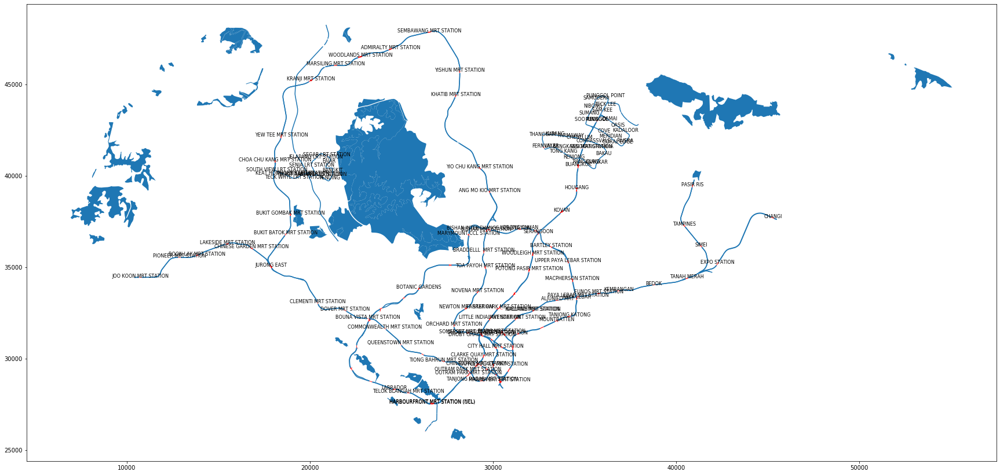

In [390]:
# Load a GeoDataFrame containing regions in Ghana
mrt_lines = gpd.read_file("mp08-rail-line-shp/G_MP08_RAIL_LI.shp")
mrt_stns = gpd.read_file("mp08-rail-station-shp/G_MP08_RAIL_STN_PL.shp")
ax = mrt_stns.plot(figsize=(30, 20), color='red', linestyle='-')
mrt_lines.plot(ax=ax)
mrt_stns.apply(lambda x: ax.annotate(s=x.NAME, xy=x.geometry.centroid.coords[0], ha='center', size=8), axis=1);
nature_parks.plot(ax=ax)


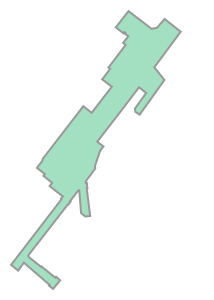

In [349]:
mrt_stns.geometry[0]

In [350]:
mrt_stns = pd.read_csv('sg_mrt_stns.csv')
mrt_stns.head()

,station_name,type,lat,lng
0,Jurong East,MRT,1.333207,103.742308
1,Bukit Batok,MRT,1.349069,103.749596
2,Bukit Gombak,MRT,1.359043,103.751863
3,Choa Chu Kang,MRT,1.385417,103.744316
4,Yew Tee,MRT,1.397383,103.747523


In [475]:
# Create a map to visualize median prices of 3-room resale flats
sg_map = folium.Map(location=[1.38, 103.8], zoom_start=11.5, tiles='openstreetmap')

# Add points to the map
for idx, row in median_room_3.iterrows():
    Marker(location=[row.geometry.y, row.geometry.x], 
           popup=Popup(str(row['price']), 
           show=True)
          ).add_to(sg_map)
    
for idx, row in mrt_stns.iterrows():
    CircleMarker(location=[row.lat, row.lng], 
                 popup=Popup(row.station_name), 
                 show=True,
                 radius=5,
                 color='red',
                 fill=True
                ).add_to(sg_map)

# plot map
sg_map


AttributeError: 'Series' object has no attribute 'lat'

In [388]:
nature_parks = gpd.read_file("nature/G_MP14_PKWB_NAT_BNDRY_PL.shp")
nature_parks

,OBJECTID,OID_1,CLASSIFCTN,INC_CRC,FMEL_UPD_D,X_ADDR,Y_ADDR,SHAPE_Leng,SHAPE_Area,geometry
0,1,0,NATURE AREA WATERBODY,5A121441E9D7A02B,2016-07-18,20339.9728,36992.9516,689.115103,1.866480e+04,"POLYGON ((20332.868 37064.987, 20332.870 37065..."
1,2,0,NATURE AREA OTHERS,1421F533E340D034,2016-07-18,52535.6444,46078.3266,345.669482,7.945552e+03,"POLYGON ((52481.825 46082.809, 52500.366 46116..."
2,3,0,NATURE AREA OTHERS,FA0D5636109A7EB4,2016-07-18,51799.7050,46522.5073,1273.254653,6.128410e+04,"POLYGON ((51759.607 46500.002, 51752.545 46517..."
3,4,0,NATURE RESERVE,C9EEA6593478B65B,2016-07-18,23214.4239,44014.3259,3485.034276,3.103970e+05,"POLYGON ((24078.459 44182.186, 24067.806 44148..."
4,5,0,NATURE AREA OTHERS,9B214C9BEA8C0A40,2016-07-18,41824.4654,43985.1880,29657.641097,7.549910e+06,"POLYGON ((44305.354 44108.432, 44310.290 44105..."
...,...,...,...,...,...,...,...,...,...,...
56,57,0,NATURE RESERVE,63FEA2583BFB99BC,2016-07-18,15873.9108,47554.1678,15677.761582,1.102499e+06,"MULTIPOLYGON (((15915.070 47241.715, 15915.755..."
57,58,0,NATURE AREA,764D6FD0E0B510C0,2016-07-18,22026.4975,47700.5750,3603.187453,1.633422e+05,"MULTIPOLYGON (((22199.492 47331.658, 22197.711..."
58,59,0,NATURE AREA WATERBODY,773777DFB4E3D88B,2016-07-18,22024.0374,47615.6263,1470.822673,1.966532e+04,"POLYGON ((21866.787 47910.768, 21882.491 47939..."
59,60,0,NATURE RESERVE WATERBODY,FEF213D553C92606,2016-07-18,26892.8253,36391.0006,16853.163392,1.044692e+06,"POLYGON ((27532.811 36961.005, 27534.951 36960..."


**Lets now analyse the growth rate of median resale flat prices by room type**

In [393]:
# lets start with getting the time series annual average of 3-room flats
prices = rmp.dropna().rename(columns={'quarter': 'year'})
prices.year = prices.year.str[:4]
prices

,year,town,flat_type,price
2,2007,"ang mo kio, Singapore",3-room,172000.0
3,2007,"ang mo kio, Singapore",4-room,260000.0
4,2007,"ang mo kio, Singapore",5-room,372000.0
8,2007,"bedok, Singapore",3-room,172000.0
9,2007,"bedok, Singapore",4-room,224500.0
...,...,...,...,...
8105,2020,"woodlands, Singapore",exec,578000.0
8108,2020,"yishun, Singapore",3-room,270000.0
8109,2020,"yishun, Singapore",4-room,360000.0
8110,2020,"yishun, Singapore",5-room,482500.0


**Initial analysis shows that from 2007 to 2020:**
- Median prices of all flat types have generally increased
- Median 3-room flat prices have appreciated by 47%
- Median 4-room flat prices have appreciated by 60%
- Median 5-room flat prices have appreciated by 52.5%

**However from 2013 to 2015 - Median prices of all flat types fell by about 20%, what happened?**

[Cooling measures by MAS](https://www.straitstimes.com/singapore/new-property-cooling-measures-announced)
- increase buyer stamp duty (ABSD) by 5-7%
- lower loan to value (LTV) financing quantum up to 50%
- higher cash downpayment for 2nd mortgages from 10 to 25%
- PRs disallowed from subletting their entire flat

**From 2015-2020:**
- Median 3-room flat prices have depreciated by 13%
- Median 4-room flat prices have appreciated by 1.01%
- Median 5-room flat prices have appreciated by 10.4%

There arent enough datapoints from this dataset about 2-room and executive flats.

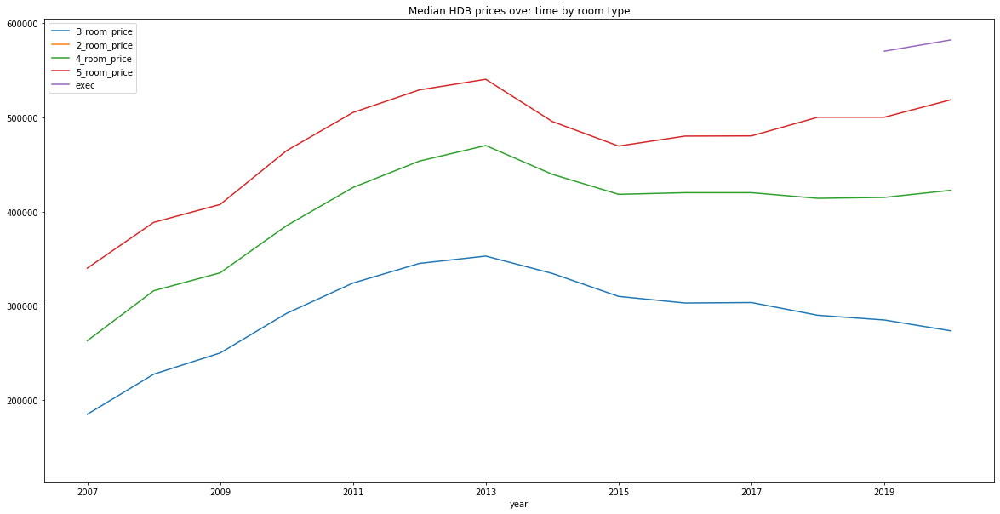

In [177]:
prices = resale_median_prices.dropna().rename(columns={'quarter': 'year'})
prices.year = prices.year.str[:4]
all_prices = prices[prices.flat_type == '3-room'].groupby('year').median()
all_prices['2_room_price'] = prices[prices.flat_type == '2-room'].groupby('year').median()
all_prices['4_room_price'] = prices[prices.flat_type == '4-room'].groupby('year').median()
all_prices['5_room_price'] = prices[prices.flat_type == '5-room'].groupby('year').median()
all_prices['exec'] = prices[prices.flat_type == 'exec'].groupby('year').median()
all_prices = all_prices.rename(columns={'price': '3_room_price'})
all_prices.plot(title='Median HDB prices over time by room type', figsize=(20, 10))

In [395]:
all_prices

,3_room_price,2_room_price,4_room_price,5_room_price,exec
year,,,,,
2007,185000.0,136000.0,263000.0,340000.0,NaN
2008,227500.0,NaN,316000.0,388500.0,NaN
2009,250000.0,NaN,335000.0,407500.0,NaN
2010,292000.0,205500.0,385000.0,464500.0,NaN
2011,324150.0,NaN,425500.0,505000.0,NaN
2012,345000.0,NaN,453500.0,529000.0,NaN
2013,352750.0,NaN,470000.0,540250.0,NaN
2014,334400.0,NaN,439500.0,495500.0,NaN
2015,310000.0,NaN,418250.0,469450.0,NaN


###  Granular Analysis of Resale Prices From 2015 onwards

Since we saw cooling measures impacting prices from 2013 to end 2014, the most accurate projection of property prices would be their growth after 2015, assuming property laws remain unchanged in the near future. Hence let us use a more granualar dataset between 2015 to 2020 to investigate
- growth rate of prices by flat-type --> median, bottom and top 25th percentile
- growth rate of prices by location
- how other factors like storey_range, flat models, lease commencement and remaining dates affect resale price

In [462]:
resale_flats_2017_2020 = pd.read_csv('resale-flat-prices/resale-flat-prices-2017.csv')
resale_flats_2015_2016 = pd.read_csv('resale-flat-prices/resale-flat-prices-1516.csv')
resale_flats_2017_2020.remaining_lease = resale_flats_2017_2020.remaining_lease.str[:2]
prices_2015_2020 = pd.concat([resale_flats_2015_2016, resale_flats_2017_2020])
prices_2015_2020

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0
...,...,...,...,...,...,...,...,...,...,...,...
70874,2020-05,YISHUN,5 ROOM,342A,YISHUN RING RD,10 TO 12,117.0,Premium Apartment,2016,94,578000.0
70875,2020-05,YISHUN,5 ROOM,335C,YISHUN ST 31,13 TO 15,112.0,Improved,2015,94,550000.0
70876,2020-05,YISHUN,5 ROOM,505A,YISHUN ST 51,13 TO 15,112.0,Improved,2016,94,540000.0
70877,2020-05,YISHUN,EXECUTIVE,391,YISHUN AVE 6,10 TO 12,142.0,Apartment,1988,67,553000.0


In [171]:
prices_2015_2020 = prices_2015_2020.dropna().rename(columns={'month': 'year'})
prices_2015_2020.year = prices_2015_2020.year.str[:4]
prices_2015_2020 = prices_2015_2020[['year', 'town', 'flat_type', 'resale_price']]
prices_2015_2020

,year,town,flat_type,resale_price
0,2015,ANG MO KIO,3 ROOM,255000.0
1,2015,ANG MO KIO,3 ROOM,275000.0
2,2015,ANG MO KIO,3 ROOM,285000.0
3,2015,ANG MO KIO,3 ROOM,290000.0
4,2015,ANG MO KIO,3 ROOM,290000.0
...,...,...,...,...
70874,2020,YISHUN,5 ROOM,578000.0
70875,2020,YISHUN,5 ROOM,550000.0
70876,2020,YISHUN,5 ROOM,540000.0
70877,2020,YISHUN,EXECUTIVE,553000.0


From this we can see how prices for all room types have changed from 2015 to 2020:
- Median 2-room flat prices have depreciated by 6.5%
- Median 3-room flat prices have depreciated by 8.7%
- Median 4-room flat prices have apppreciated by 0.5%
- Median 5-room flat prices have apppreciated by 10.5%
- Median Executive flat prices have remained the same


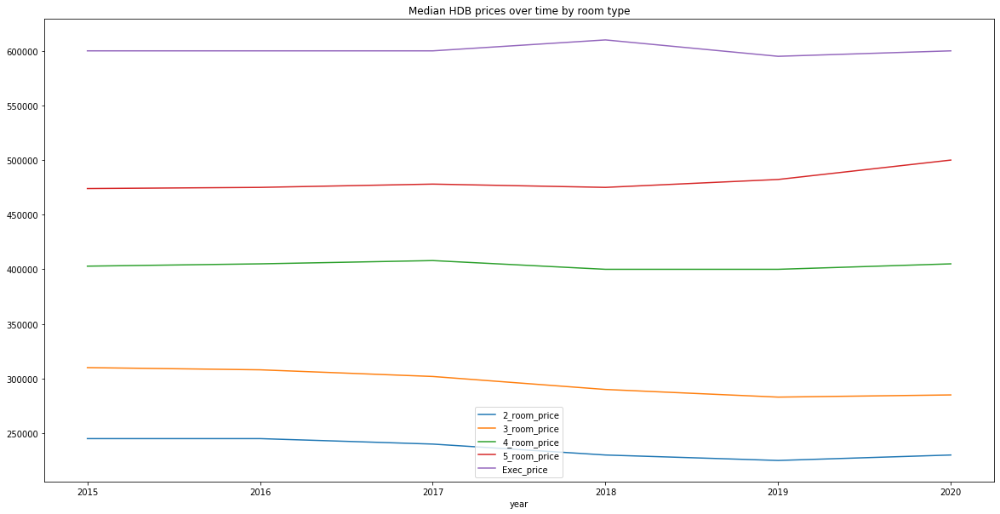

In [178]:
resale_flats_2017_2020 = pd.read_csv('resale-flat-prices/resale-flat-prices-2017.csv')
resale_flats_2015_2016 = pd.read_csv('resale-flat-prices/resale-flat-prices-1516.csv')
resale_flats_2017_2020.remaining_lease = resale_flats_2017_2020.remaining_lease.str[:2]
prices_2015_2020 = pd.concat([resale_flats_2015_2016, resale_flats_2017_2020])
prices_2015_2020 = prices_2015_2020.dropna().rename(columns={'month': 'year'})
prices_2015_2020.year = prices_2015_2020.year.str[:4]
prices_2015_2020 = prices_2015_2020[['year', 'town', 'flat_type', 'resale_price']]

prices_1520 = prices_2015_2020[prices_2015_2020.flat_type == '2 ROOM'].groupby('year').median()
prices_1520['3_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '3 ROOM'].groupby('year').median()
prices_1520['4_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '4 ROOM'].groupby('year').median()
prices_1520['5_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '5 ROOM'].groupby('year').median()
prices_1520['Exec_price'] = prices_2015_2020[prices_2015_2020.flat_type == 'EXECUTIVE'].groupby('year').median()
prices_1520 = prices_1520.rename(columns={'resale_price': '2_room_price'})
prices_1520.plot(title='Median HDB prices over time by room type',  figsize=(20, 10))


From this we can see how prices for top 75th percentile by room types have changed from 2015 to 2020:

- 2-room flat prices have depreciated by 6%
- 3-room flat prices have depreciated by 5.4%
- 4-room flat prices have apppreciated by 2.1%
- 5-room flat prices have apppreciated by 6.3%
- Median Executive flat prices have apppreciated by 2.2%

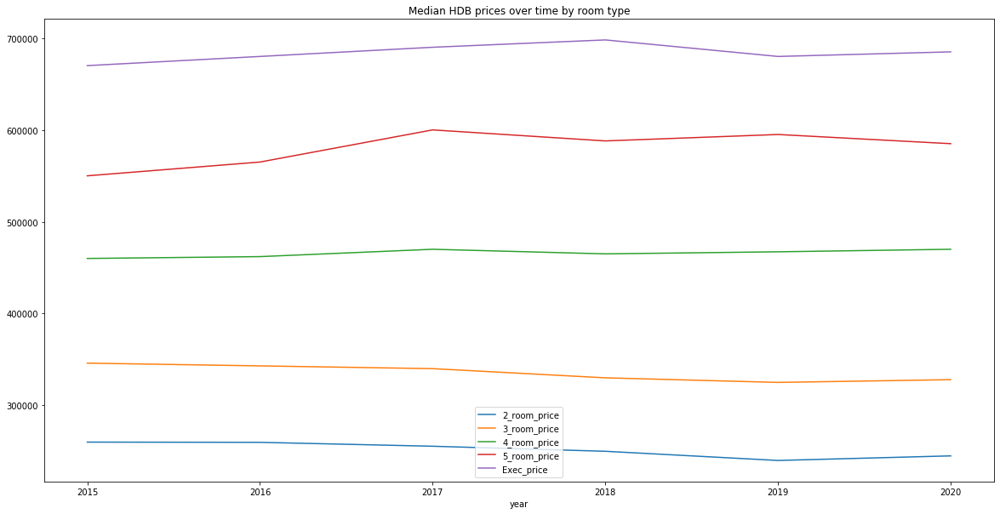

In [200]:
# top 75th percentile
cols = ['year', 'resale_price']
prices_1520_75 = prices_2015_2020[prices_2015_2020.flat_type == '2 ROOM'][cols].groupby('year').quantile(0.75)
prices_1520_75['3_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '3 ROOM'][cols].groupby('year').quantile(0.75)
prices_1520_75['4_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '4 ROOM'][cols].groupby('year').quantile(0.75)
prices_1520_75['5_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '5 ROOM'][cols].groupby('year').quantile(0.75)
prices_1520_75['Exec_price'] = prices_2015_2020[prices_2015_2020.flat_type == 'EXECUTIVE'][cols].groupby('year').quantile(0.75)
prices_1520_75 = prices_1520_75.rename(columns={'resale_price': '2_room_price'})
prices_1520_75.plot(title='Median HDB prices over time by room type',  figsize=(20, 10))

From this we can see how prices for top 90th percentile by room types have changed from 2015 to 2020:

- 2-room flat prices have depreciated by 3.78%
- 3-room flat prices have depreciated by 2.1%
- 4-room flat prices have apppreciated by 1.75%
- 5-room flat prices have apppreciated by 2.8%
- Executive flat prices have apppreciated by 1.58%

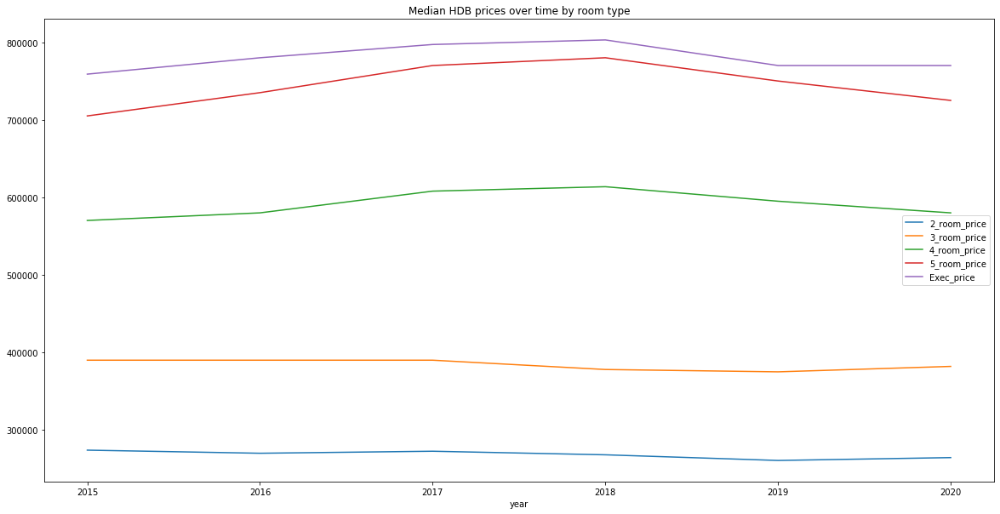

In [206]:
# top 90th percentile - shows no conclusive trends
cols = ['year', 'resale_price']
prices_1520_90 = prices_2015_2020[prices_2015_2020.flat_type == '2 ROOM'][cols].groupby('year').quantile(0.9)
prices_1520_90['3_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '3 ROOM'][cols].groupby('year').quantile(0.9)
prices_1520_90['4_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '4 ROOM'][cols].groupby('year').quantile(0.9)
prices_1520_90['5_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '5 ROOM'][cols].groupby('year').quantile(0.9)
prices_1520_90['Exec_price'] = prices_2015_2020[prices_2015_2020.flat_type == 'EXECUTIVE'][cols].groupby('year').quantile(0.9)
prices_1520_90 = prices_1520_90.rename(columns={'resale_price': '2_room_price'})
prices_1520_90.plot(title='Median HDB prices over time by room type',  figsize=(20, 10))


From this we can see how prices for bottom 25th percentile by room types have changed from 2015 to 2020:

- 2-room flat prices have depreciated by 12.3%
- 3-room flat prices have depreciated by 13.7%
- 4-room flat prices have depreciated by 4.5%
- 5-room flat prices have depreciated by 0.6%
- Median Executive flat prices have apppreciated by 0.9%

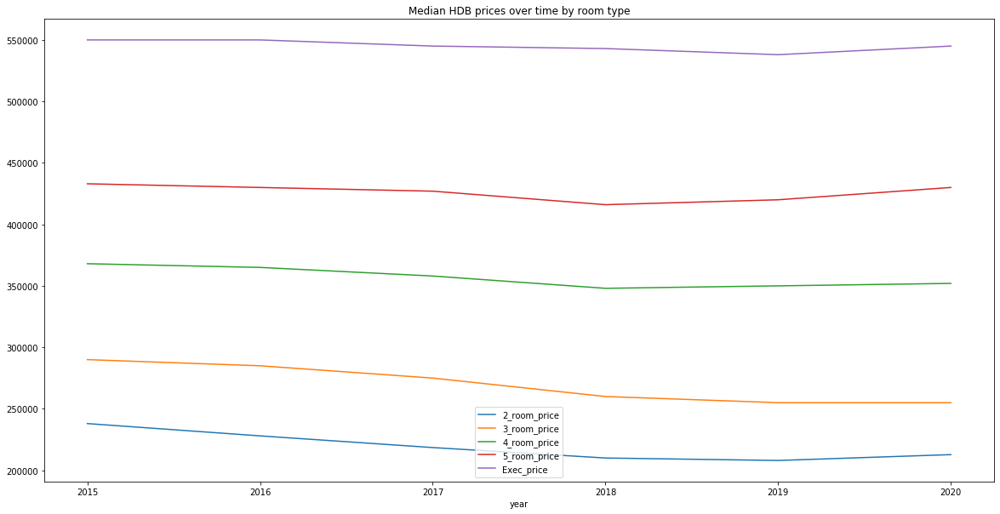

In [199]:
# bottom 25th percentile
cols = ['year', 'resale_price']
prices_1520_25 = prices_2015_2020[prices_2015_2020.flat_type == '2 ROOM'][cols].groupby('year').quantile(0.25)
prices_1520_25['3_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '3 ROOM'][cols].groupby('year').quantile(0.25)
prices_1520_25['4_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '4 ROOM'][cols].groupby('year').quantile(0.25)
prices_1520_25['5_room_price'] = prices_2015_2020[prices_2015_2020.flat_type == '5 ROOM'][cols].groupby('year').quantile(0.25)
prices_1520_25['Exec_price'] = prices_2015_2020[prices_2015_2020.flat_type == 'EXECUTIVE'][cols].groupby('year').quantile(0.25)
prices_1520_25 = prices_1520_25.rename(columns={'resale_price': '2_room_price'})
prices_1520_25.plot(title='Median HDB prices over time by room type',  figsize=(20, 10))

In [692]:
flats = prices_2015_2020.dropna().rename(columns={'month': 'year'})
flats.year = flats.year.str[:4]
flats = flats[flats.flat_type == '3 ROOM'].groupby('town').mean().reset_index()
flats

,town,floor_area_sqm,lease_commence_date,resale_price
0,ANG MO KIO,70.888536,1980.372487,308378.942152
1,BEDOK,68.177608,1980.175055,300873.954048
2,BISHAN,65.303030,1983.450216,361562.181818
3,BUKIT BATOK,68.749204,1985.775302,271754.068746
4,BUKIT MERAH,66.923984,1981.598952,384898.229358
5,BUKIT PANJANG,71.055556,1994.831276,291190.139918
6,BUKIT TIMAH,69.102041,1975.653061,410589.551020
7,CENTRAL AREA,65.154639,1978.806701,421513.835052
8,CHOA CHU KANG,71.216418,1991.694030,280634.720149
9,CLEMENTI,69.754359,1981.437453,336101.860500


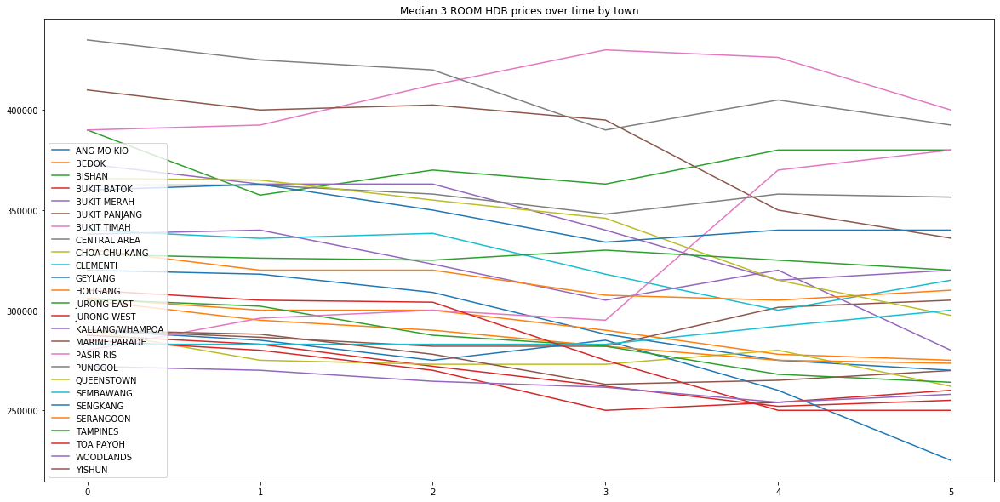

town
CENTRAL AREA       435000
MARINE PARADE      410000
BUKIT TIMAH        390000
BISHAN             390000
BUKIT MERAH        373000
QUEENSTOWN         365888
PUNGGOL            362500
SENGKANG           360000
CLEMENTI           340000
KALLANG/WHAMPOA    338000
SERANGOON          330500
TAMPINES           328000
ANG MO KIO         320000
TOA PAYOH          310000
BEDOK              306000
JURONG EAST        305500
HOUGANG            305000
BUKIT PANJANG      290000
YISHUN             290000
CHOA CHU KANG      290000
GEYLANG            290000
BUKIT BATOK        287500
JURONG WEST        285000
SEMBAWANG          283000
PASIR RIS          280000
WOODLANDS          272000
year                 2015
Name: 0, dtype: int64
town
BUKIT TIMAH        400000
CENTRAL AREA       392500
BISHAN             380000
PASIR RIS          380000
PUNGGOL            356500
SENGKANG           340000
MARINE PARADE      336000
TAMPINES           320000
BUKIT MERAH        320000
CLEMENTI           315000
SERANG

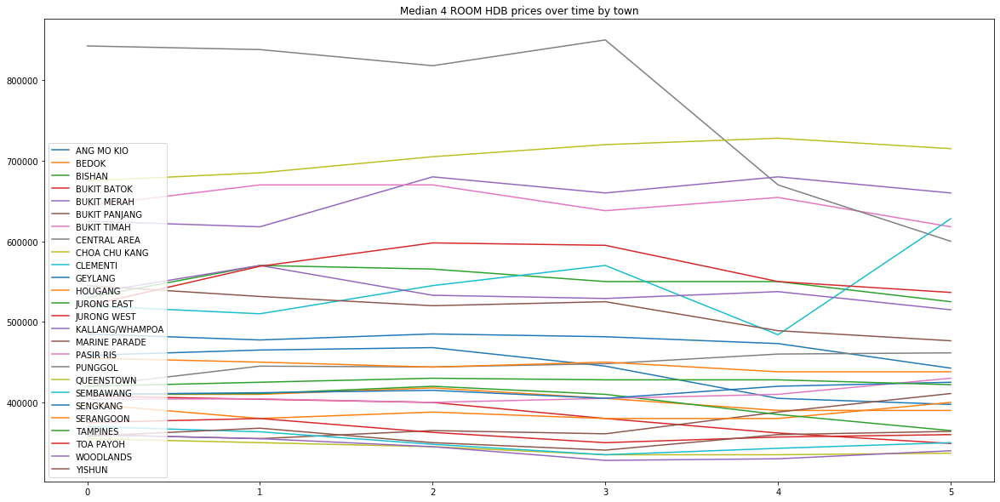

town
CENTRAL AREA       842500
QUEENSTOWN         675000
BUKIT TIMAH        644000
BUKIT MERAH        625000
MARINE PARADE      545000
KALLANG/WHAMPOA    535000
BISHAN             530000
TOA PAYOH          520000
CLEMENTI           520000
GEYLANG            485000
ANG MO KIO         458400
SERANGOON          455000
TAMPINES           420000
PUNGGOL            420000
JURONG EAST        410000
BEDOK              410000
SENGKANG           410000
BUKIT BATOK        408000
PASIR RIS          404000
HOUGANG            398000
JURONG WEST        375000
SEMBAWANG          370000
WOODLANDS          360000
BUKIT PANJANG      360000
YISHUN             358000
CHOA CHU KANG      355000
year                 2015
Name: 0, dtype: int64
town
QUEENSTOWN         715000
BUKIT MERAH        660000
CLEMENTI           628000
BUKIT TIMAH        618000
CENTRAL AREA       600000
TOA PAYOH          536500
BISHAN             525000
KALLANG/WHAMPOA    515000
MARINE PARADE      476500
PUNGGOL            461500
GEYLAN

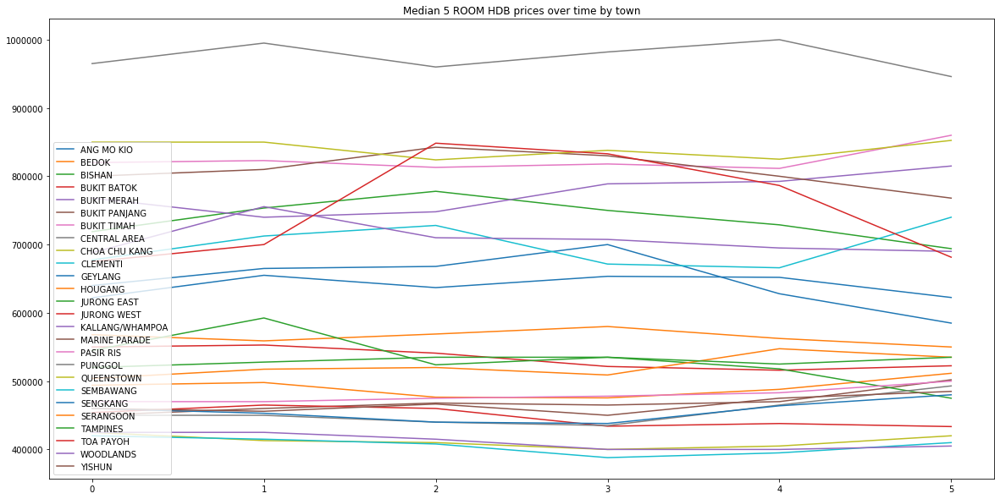

town
CENTRAL AREA       965000
QUEENSTOWN         850000
BUKIT TIMAH        820000
MARINE PARADE      800000
BUKIT MERAH        768000
BISHAN             718888
KALLANG/WHAMPOA    688000
CLEMENTI           677500
TOA PAYOH          675000
ANG MO KIO         639988
GEYLANG            622000
BEDOK              568000
BUKIT BATOK        550000
JURONG EAST        545000
TAMPINES           520000
SERANGOON          504000
HOUGANG            494000
PASIR RIS          470000
YISHUN             460000
SENGKANG           460000
JURONG WEST        454000
BUKIT PANJANG      450000
PUNGGOL            450000
CHOA CHU KANG      425000
WOODLANDS          425000
SEMBAWANG          420000
year                 2015
Name: 0, dtype: int64
town
CENTRAL AREA       946000
BUKIT TIMAH        860000
QUEENSTOWN         852500
BUKIT MERAH        815000
MARINE PARADE      768000
CLEMENTI           740000
BISHAN             694000
KALLANG/WHAMPOA    690000
TOA PAYOH          681500
GEYLANG            622500
ANG MO

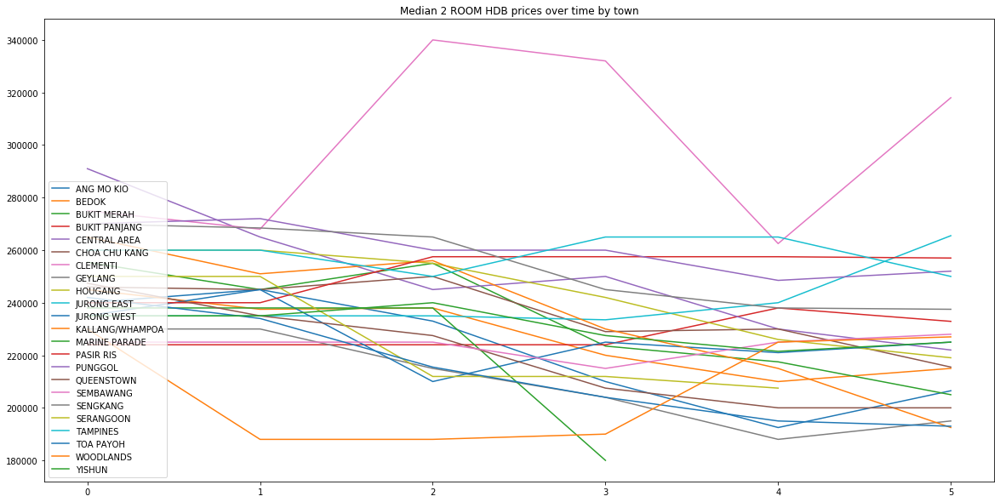

ValueError: cannot convert float NaN to integer

In [474]:
for flat_type in prices_2015_2020.flat_type.unique():
    prices_loc = prices_2015_2020.dropna().rename(columns={'month': 'year'})
    prices_loc.year = prices_loc.year.str[:4]
    prices_loc = prices_loc[prices_loc.flat_type == flat_type]
    prices_loc = prices_loc[['year', 'town', 'flat_type', 'resale_price']]
    prices_loc = prices_loc.groupby(['year', 'town']).median()
    prices_loc = pd.pivot_table(prices_loc, values = 'resale_price', index=['year'], columns = ['town']).reset_index()
    prices_loc = prices_loc.fillna(method='backfill')
    prices_loc.plot(title='Median {} HDB prices over time by town'.format(flat_type),  figsize=(20, 10))
    plt.legend(loc='lower left')
    plt.show()
    prices_2015 = prices_loc.iloc[0].astype(int)
    prices_2020 = prices_loc.iloc[-1].astype(int)
    print(prices_2015.sort_values(ascending=False))
    print(prices_2020.sort_values(ascending=False))
    pct_change = (prices_2020 - prices_2015)*100 / prices_2015
    print(pct_change.sort_values(ascending=False))

In [572]:
columns = ['Name', 'type', 'geometry']
df = pd.read_csv('sg_mrt_stns.csv')
mrt_stns = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
mrt_stns['Name'] = mrt_stns['station_name']
mrt_stns = mrt_stns[columns]
mrt_stns

,Name,type,geometry
0,Jurong East,MRT,POINT (103.74231 1.33321)
1,Bukit Batok,MRT,POINT (103.74960 1.34907)
2,Bukit Gombak,MRT,POINT (103.75186 1.35904)
3,Choa Chu Kang,MRT,POINT (103.74432 1.38542)
4,Yew Tee,MRT,POINT (103.74752 1.39738)
...,...,...,...
152,Punggol Point,LRT,POINT (103.90668 1.41693)
153,Samudera,LRT,POINT (103.90219 1.41595)
154,Nibong,LRT,POINT (103.90032 1.41186)
155,Sumang,LRT,POINT (103.89861 1.40850)


In [520]:
clinics = gpd.read_file("chas-clinics/chas-clinics-geojson.geojson")
clinics['type'] = 'clinic'
clinics = clinics[columns]
clinics

,Name,type,geometry
0,kml_1,clinic,POINT Z (103.84908 1.34842 0.00000)
1,kml_2,clinic,POINT Z (103.85464 1.36272 0.00000)
2,kml_3,clinic,POINT Z (103.93687 1.33143 0.00000)
3,kml_4,clinic,POINT Z (103.86109 1.31943 0.00000)
4,kml_5,clinic,POINT Z (103.84680 1.28896 0.00000)
...,...,...,...
1065,kml_1066,clinic,POINT Z (103.85403 1.33691 0.00000)
1066,kml_1067,clinic,POINT Z (103.86163 1.30394 0.00000)
1067,kml_1068,clinic,POINT Z (103.87378 1.36935 0.00000)
1068,kml_1069,clinic,POINT Z (103.93921 1.33178 0.00000)


In [607]:
malls_attractions = pd.read_csv('carpark-rates/carpark-rates.csv')
malls_attractions = malls_attractions[malls_attractions.category != 'Hotels']
malls_attractions['Name'] = malls_attractions['carpark'] + ', Singapore'
malls_attractions['type'] = malls_attractions.category.apply(lambda x: 'Mall' if x != 'Singapore Attractions' else x)
malls_attractions.reset_index(inplace=True)
latlng = malls_attractions.apply(lambda x: gmaps.geocode(x['Name'])[0]['geometry']['location'], axis=1)
latlng = pd.json_normalize(malls_attractions.apply(lambda x: gmaps.geocode(x['Name'])[0]['geometry']['location'], axis=1))
malls_attractions['lat'] = latlng.lat
malls_attractions['lng'] = latlng.lng
malls_attractions = gpd.GeoDataFrame(malls_attractions, geometry=gpd.points_from_xy(malls_attractions.lng, malls_attractions.lat))
malls_attractions = malls_attractions[columns]
malls_attractions

,Name,type,geometry
0,"25 Toa Payoh Lorong 8, Singapore",Mall,POINT (103.86075 1.33856)
1,"45 Burghley Drive, Singapore",Mall,POINT (103.85957 1.36023)
2,"Ang Mo Kio Hub, Singapore",Mall,POINT (103.84844 1.36953)
3,"Balestier Plaza, Singapore",Mall,POINT (103.85286 1.32150)
4,"Balestier Point, Singapore",Mall,POINT (103.85286 1.32150)
...,...,...,...
297,"Valley Point, Singapore",Mall,POINT (103.82710 1.29317)
298,"West Coast Plaza (Ginza Plaza), Singapore",Mall,POINT (103.76586 1.30373)
299,"West Mall, Singapore",Mall,POINT (103.74918 1.35001)
300,"Westgate, Singapore",Mall,POINT (103.74280 1.33453)


In [605]:
hawkers = gpd.read_file("hawker-centres/hawker-centres-geojson.geojson")
hawkers['type'] = 'hawker-centre'
hawkers = hawkers[columns]
hawkers

,Name,type,geometry
0,kml_1,hawker-centre,POINT Z (103.84825 1.36411 0.00000)
1,kml_2,hawker-centre,POINT Z (103.85537 1.36277 0.00000)
2,kml_3,hawker-centre,POINT Z (103.85635 1.36824 0.00000)
3,kml_4,hawker-centre,POINT Z (103.88598 1.35912 0.00000)
4,kml_5,hawker-centre,POINT Z (103.88394 1.30242 0.00000)
...,...,...,...
120,kml_121,hawker-centre,POINT Z (103.80290 1.29324 0.00000)
121,kml_122,hawker-centre,POINT Z (103.84258 1.28499 0.00000)
122,kml_123,hawker-centre,POINT Z (103.93056 1.32474 0.00000)
123,kml_124,hawker-centre,POINT Z (103.94113 1.32419 0.00000)


In [522]:
supermarkets = gpd.read_file("supermarkets/supermarkets-geojson.geojson")
supermarkets['type'] = 'supermarket'
supermarkets = supermarkets[columns]
supermarkets

,Name,type,geometry
0,kml_1,supermarket,POINT Z (103.90126 1.40230 0.00000)
1,kml_2,supermarket,POINT Z (103.87091 1.31424 0.00000)
2,kml_3,supermarket,POINT Z (103.88637 1.37332 0.00000)
3,kml_4,supermarket,POINT Z (103.91494 1.33296 0.00000)
4,kml_5,supermarket,POINT Z (103.95301 1.35345 0.00000)
...,...,...,...
521,kml_522,supermarket,POINT Z (103.88515 1.31329 0.00000)
522,kml_523,supermarket,POINT Z (103.88188 1.31358 0.00000)
523,kml_524,supermarket,POINT Z (103.90995 1.33810 0.00000)
524,kml_525,supermarket,POINT Z (103.89615 1.30609 0.00000)


In [524]:
parks = gpd.read_file("parkssg/parks-sg-shp/RelaxSG.shp")
parks['Name'] = parks.NAME
parks['type'] = 'park'
parks = parks[columns] # geometry doesnt look right D:
parks.head()

,Name,type,geometry
0,Jurong Central Park,park,POINT (14004.464 35513.455)
1,Kallang Riverside Park,park,POINT (32144.680 32140.250)
2,Kent Ridge Park,park,POINT (23243.179 29602.972)
3,MacRitchie Reservoir Park,park,POINT (28140.563 36031.343)
4,Mount Faber Park,park,POINT (26133.780 28566.530)


In [525]:
sports = gpd.read_file("sportsg-sport-facilities/sportsg-sport-facilities-geojson.geojson")
sports['type'] = 'sports facility'
sports = sports[columns]
sports.head()

,Name,type,geometry
0,kml_1,sports facility,"POLYGON Z ((103.94077 1.35437 0.00000, 103.940..."
1,kml_2,sports facility,"POLYGON Z ((103.95242 1.37449 0.00000, 103.952..."
2,kml_3,sports facility,"POLYGON Z ((103.80220 1.29703 0.00000, 103.802..."
3,kml_4,sports facility,"POLYGON Z ((103.88754 1.39629 0.00000, 103.887..."
4,kml_5,sports facility,"POLYGON Z ((103.87482 1.35780 0.00000, 103.874..."


In [698]:
"""
TO DO:
1. Concatenate all DFs together with name, type and geometry 
2. Plot on map with different colors, showing 1 km radius from each estate
3. Compute count of each amenity within 1 km radius of each estate
4. Change median_3 DF to that of using all
"""
amenities = pd.concat([mrt_stns, sports, supermarkets, hawkers, clinics, malls_attractions])

color = {'MRT': 'red', 'LRT': 'red', 'supermarket': 'blue',
       'hawker-centre': 'black', 'clinic': 'green', 'malls_attractions': 'orange'}

# create 1km radius around each HDB estate
flats.crs = {'init' :'epsg:3414'}
radius = flats.geometry.buffer(0.01) # 1km


# Create a map to visualize estates and amenities
sg_map = folium.Map(location=[1.38, 103.8], zoom_start=11.5, tiles='openstreetmap')
for idx, row in flats.iterrows():
    Marker([row.geometry.y, row.geometry.x]).add_to(sg_map)
    Circle(location=[row.geometry.y, row.geometry.x], color='blue', show=True, radius=1000, fill=False).add_to(sg_map) 

folium.GeoJson(radius.to_crs(epsg=3890)).add_to(sg_map)

for idx, row in amenities.iterrows():
    if row['type'] in color:
        CircleMarker(location=[row.geometry.y, row.geometry.x], color=color[row['type']], 
                     popup=Popup(row.Name), show=True, radius=1, fill=True).add_to(sg_map)

sg_map

In [707]:
import numpy as np

radius = flats.geometry.buffer(0.01)
for amenity in amenities['type'].unique():
    data = amenities[amenities['type'] == amenity]
    count = radius.apply(lambda x: np.sum(x.contains(data.iloc[i].geometry) for i in range(len(data))))
    flats['count_' + amenity] = count
    
flats.head()

,town,floor_area_sqm,lease_commence_date,resale_price,geometry,count_MRT,count_LRT,count_sports facility,count_supermarket,count_hawker-centre,count_clinic,count_Mall,count_Singapore Attractions
0,"ANG MO KIO, Singapore",70.888536,1980.372487,308378.942152,POINT (103.84543 1.36911),1,0,1,9,6,35,1,0
1,"BEDOK, Singapore",68.177608,1980.175055,300873.954048,POINT (103.92734 1.32360),1,0,1,12,4,25,2,0
2,"BISHAN, Singapore",65.303030,1983.450216,361562.181818,POINT (103.83521 1.35258),1,0,0,3,1,4,1,0
3,"BUKIT BATOK, Singapore",68.749204,1985.775302,271754.068746,POINT (103.76368 1.35903),1,0,0,2,0,3,0,1
4,"BUKIT MERAH, Singapore",66.923984,1981.598952,384898.229358,POINT (103.82392 1.28190),1,0,1,11,10,27,2,0


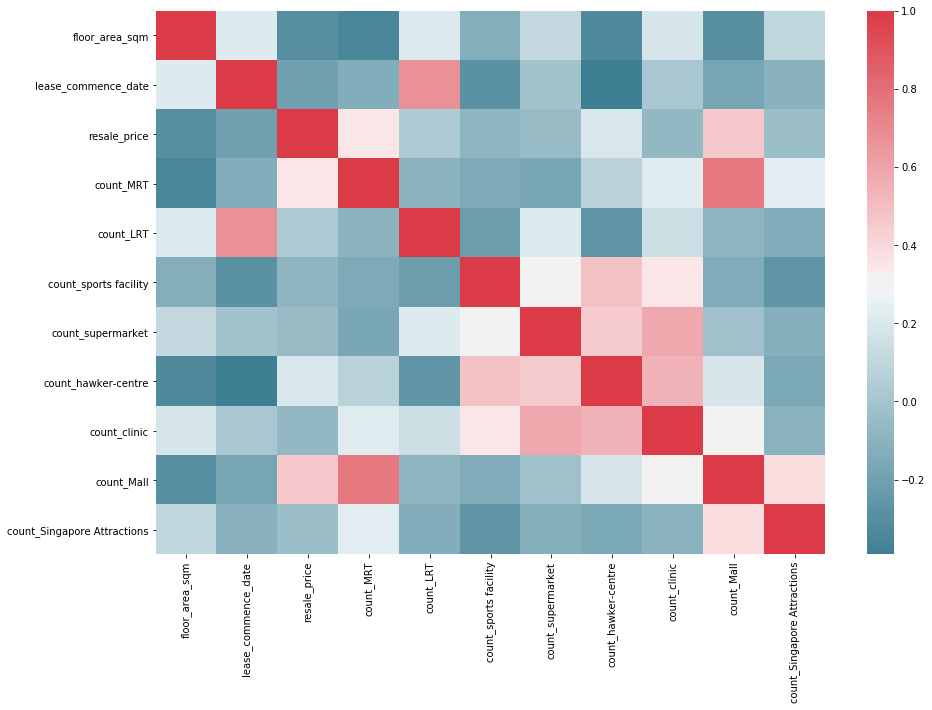

In [706]:
import seaborn as sns
plt.figure(figsize=(15, 10))
sns.heatmap(flats.corr(), cmap=sns.diverging_palette(220, 10, as_cmap=True))

In [697]:
flats = prices_2015_2020.dropna().rename(columns={'month': 'year'})
flats.year = flats.year.str[:4]
flats.town = flats.town + ', Singapore'
flats = flats[flats.flat_type == '3 ROOM'].groupby('town').mean().reset_index()
latlng = pd.json_normalize(flats.apply(lambda x: gmaps.geocode(x['town'])[0]['geometry']['location'], axis=1))
flats = gpd.GeoDataFrame(flats, geometry=gpd.points_from_xy(latlng.lng, latlng.lat))
flats

,town,floor_area_sqm,lease_commence_date,resale_price,geometry
0,"ANG MO KIO, Singapore",70.888536,1980.372487,308378.942152,POINT (103.84543 1.36911)
1,"BEDOK, Singapore",68.177608,1980.175055,300873.954048,POINT (103.92734 1.32360)
2,"BISHAN, Singapore",65.303030,1983.450216,361562.181818,POINT (103.83521 1.35258)
3,"BUKIT BATOK, Singapore",68.749204,1985.775302,271754.068746,POINT (103.76368 1.35903)
4,"BUKIT MERAH, Singapore",66.923984,1981.598952,384898.229358,POINT (103.82392 1.28190)
5,"BUKIT PANJANG, Singapore",71.055556,1994.831276,291190.139918,POINT (103.77195 1.37741)
6,"BUKIT TIMAH, Singapore",69.102041,1975.653061,410589.551020,POINT (103.80208 1.32941)
7,"CENTRAL AREA, Singapore",65.154639,1978.806701,421513.835052,POINT (103.85361 1.27892)
8,"CHOA CHU KANG, Singapore",71.216418,1991.694030,280634.720149,POINT (103.74696 1.38398)
9,"CLEMENTI, Singapore",69.754359,1981.437453,336101.860500,POINT (103.76494 1.31618)


Overall HDB Resale Price Trends 2015 to 2020
- 2 and 3-room flats will likely depreciate, ~6% for top 75th and ~12% for bottom 2th percentile
- 4-room flats tend to appreciate ~2.1% if > 50th percentile, and depreciate ~4.5% if < 50th percentile
- 5-room flats tend to appreciate ~0.6-6.8% 
- Executive flats tend to appreciate 0.9-2.2%

Now lets build a machine learning model to see which factors contribute most to the prices. Since its hard to predict actual prices, lets predict pct change in price instead which is easier to see. For this we will use 2015 to 2020 data, because prices before that were inconsistent due to different property laws.

In [242]:
price_data = prices_2015_2020.rename(columns={'month': 'year', 'storey_range': 'floors'})
price_data.year = price_data.year.str[:4].astype(int)
price_data.floors = price_data.floors.str[-2:].astype(int)
price_data['age'] = 2020 - price_data.lease_commence_date
price_data.remaining_lease = price_data.remaining_lease.astype(int)
cat_features = ['town', 'street_name', 'flat_type', 'flat_model']
price_data[cat_features] = ce.CountEncoder().fit_transform(price_data[cat_features])
price_data

,year,town,flat_type,block,street_name,floors,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,age
0,2015,5045,27123,174,631,9,60.0,27221,1986,70,255000.0,34
1,2015,5045,27123,541,1221,3,68.0,16198,1981,65,275000.0,39
2,2015,5045,27123,163,631,3,69.0,16198,1980,64,285000.0,40
3,2015,5045,27123,446,1221,3,68.0,16198,1979,63,290000.0,41
4,2015,5045,27123,557,1221,9,68.0,16198,1980,64,290000.0,40
...,...,...,...,...,...,...,...,...,...,...,...,...
70874,2020,7320,26328,342A,1776,12,117.0,11147,2016,94,578000.0,4
70875,2020,7320,26328,335C,154,15,112.0,27221,2015,94,550000.0,5
70876,2020,7320,26328,505A,58,15,112.0,27221,2016,94,540000.0,4
70877,2020,7320,8506,391,383,12,142.0,4309,1988,67,553000.0,32


0.9368554631719941


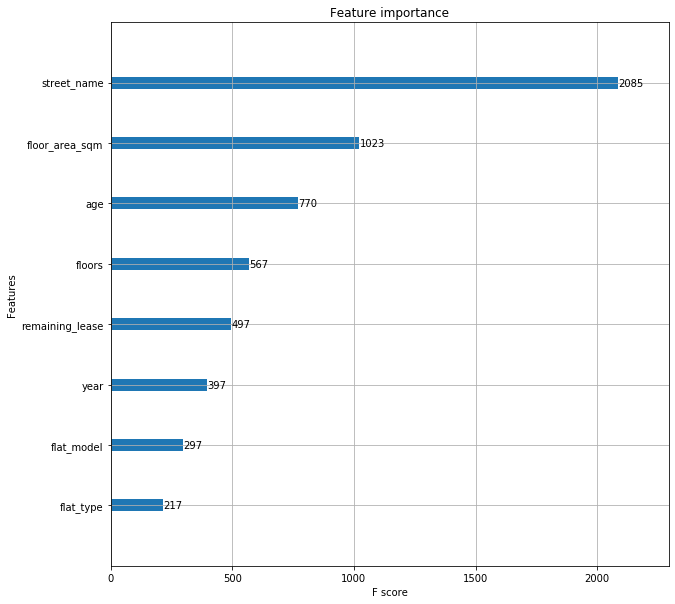

In [709]:
y = price_data.resale_price
X = price_data.drop(['resale_price', 'lease_commence_date', 'block', 'town'], axis=1)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)
xgb = XGBRegressor()
model = xgb.fit(X_train, y_train)
print(model.score(X_val, y_val))

fig, ax = plt.subplots(figsize=(10, 10))
plot_importance(xgb, ax=ax)

In [278]:
mybooster = model.get_booster()
model_bytearray = mybooster.save_raw()[4:]

def myfun(self=None):
    return model_bytearray

mybooster.save_raw = myfun
explainer = shap.TreeExplainer(mybooster)
shap_values = explainer.shap_values(X_val) 
shap.initjs() 
shap.force_plot(explainer.expected_value, shap_values, X_val)

In [290]:
def shap_plot(j):
    explainer = shap.TreeExplainer(mybooster)
    shap_values = explainer.shap_values(X_val)
    return shap.force_plot(explainer.expected_value, shap_values[j], X_val.iloc[[j]])

In [291]:
shap_plot(1)

In [292]:
shap_plot(50)

In [293]:
shap_plot(100)

Now lets find some outliers to see which were the best selling HDB Flats in 2020

In [299]:
import sys
!{sys.executable} -m pip install descartes numpy pandas geopandas shapely folium geopy googlemaps shap

Looking in indexes: https://artifactory.int.datarobot.com/artifactory/api/pypi/python-all/simple
